In [3]:
import numpy as np

In [14]:
arr1D = np.array([1, 2, 3, 4, 5])
arr2D = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

def doStuff():

  print(f"1D Array: {arr1D}")
  print(f"2D Array:\n{arr2D}")


  print(f"\nSum of 1D array:\n{arr1D} is: {np.sum(arr1D)}")
  print(f"\nSum of 2D array:\n{arr2D} is: {np.sum(arr2D)}")
  print(f"\nTranspose of 2D array:\n{arr2D}\n\nis:\n{arr2D.T}")

doStuff()

1D Array: [1 2 3 4 5]
2D Array:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

Sum of 1D array:
[1 2 3 4 5] is: 15

Sum of 2D array:
[[1 2 3]
 [4 5 6]
 [7 8 9]] is: 45

Transpose of 2D array:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

is:
[[1 4 7]
 [2 5 8]
 [3 6 9]]


In [18]:
def lotsofstuff():
  image = np.random.randint(0, 256, (5, 5), dtype = np.uint8)
  print(f"Original image:\n {image}")


  cropped = image[1:4, 1:4]
  print(f"\nCropped section:\n {cropped}")


  inverted = 255 - image
  print(f"\nInverted image:\n {inverted}")


lotsofstuff()

Original image:
 [[132 142 249 123   4]
 [162  99 137 120  36]
 [227 110 207 115  32]
 [207 122  91  76 193]
 [ 69  53 121  67 149]]

Cropped section:
 [[ 99 137 120]
 [110 207 115]
 [122  91  76]]

Inverted image:
 [[123 113   6 132 251]
 [ 93 156 118 135 219]
 [ 28 145  48 140 223]
 [ 48 133 164 179  62]
 [186 202 134 188 106]]


In [38]:
import cv2
from google.colab.patches import cv2_imshow

In [23]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


image1 Original


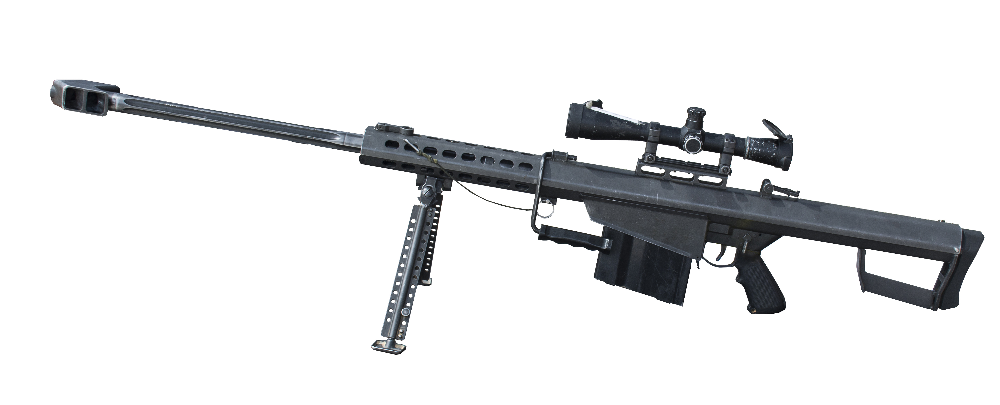

image1 Scaled


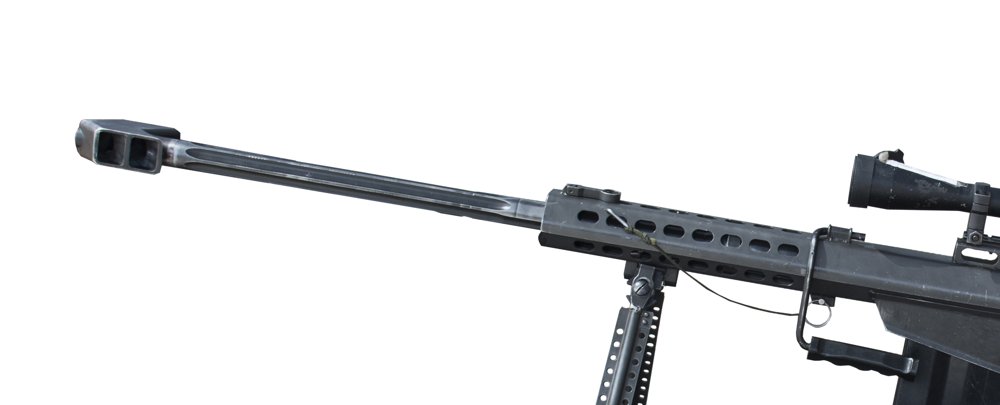

image1 Rotated


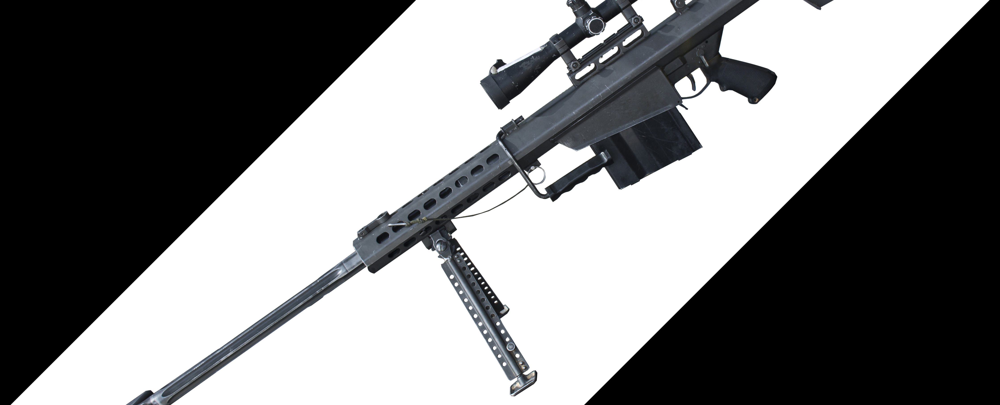

image1 Translated


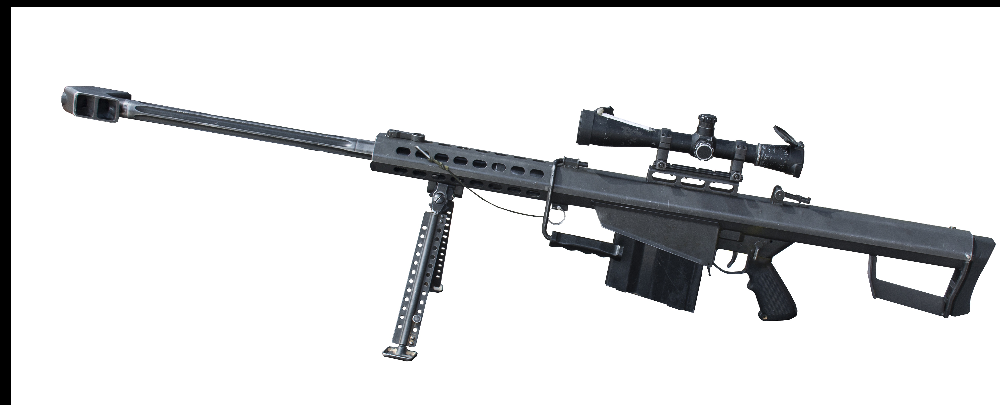

image2 Original


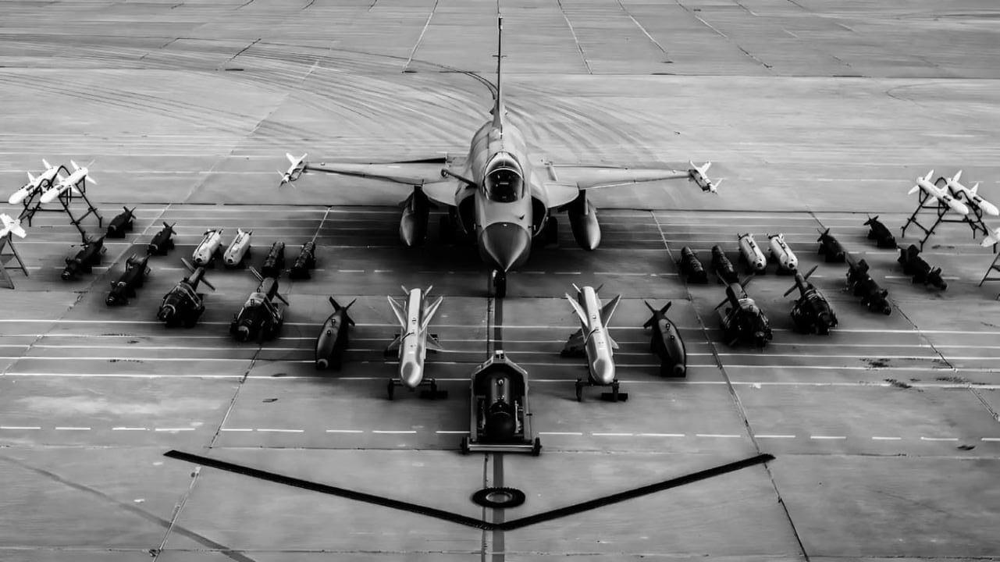

image2 Scaled


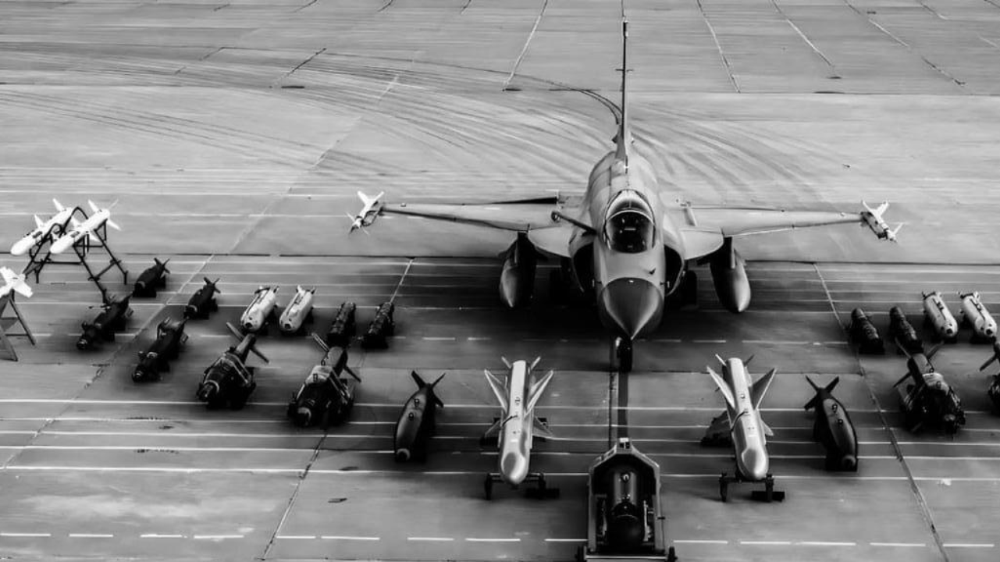

image2 Rotated


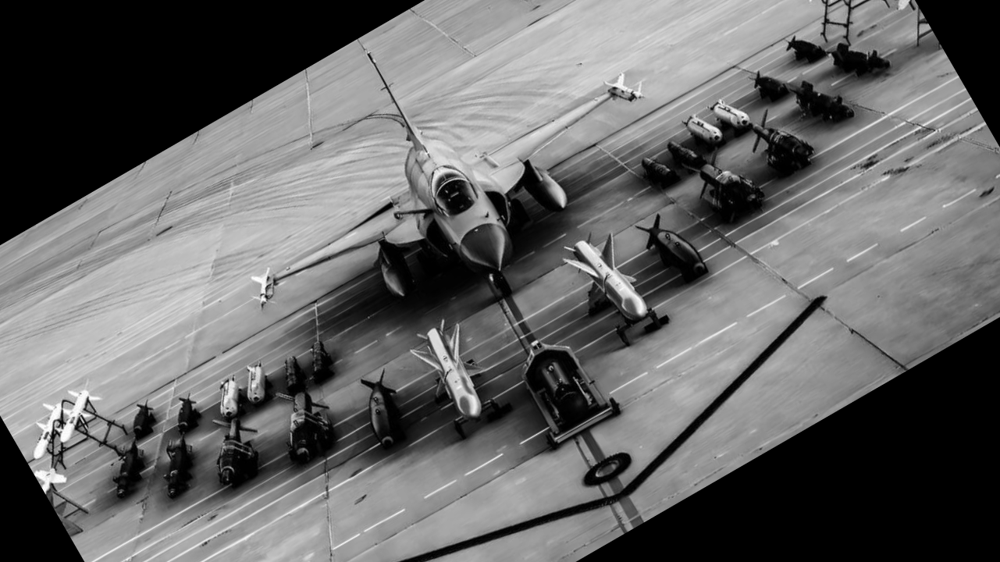

image2 Translated


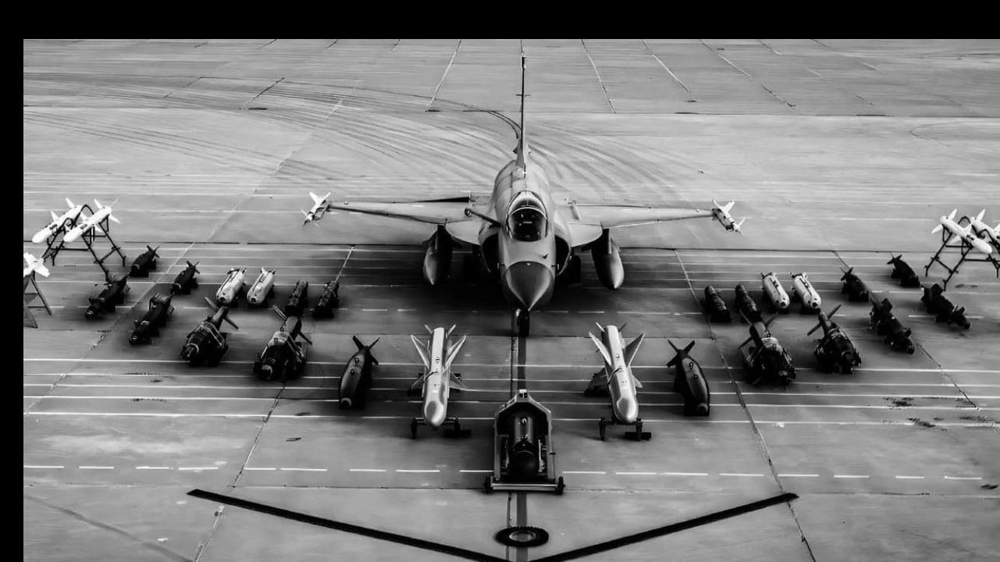

In [40]:
image1 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PlusW/Lecture 4/BarrettM82A1_test.jpg')
image2 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PlusW/Lecture 4/JF17_test.jpeg')



def scale_image(image, scale_factor):
  scaling_matrix = np.array([[scale_factor, 0, 0],
                             [0, scale_factor, 0]], dtype = np.float32)

  rows, cols = image.shape[:2]

  scaled_image = cv2.warpAffine(image, scaling_matrix, (cols, rows))
  return scaled_image



def rotate_image(image, angle):
  rows, cols = image.shape[:2]

  rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)

  rotated_image = cv2.warpAffine(image, rotation_matrix, (cols, rows))
  return rotated_image



def translate_image(image, tx, ty):
  translation_matrix = np.array([[1, 0, tx],
                                 [0, 1, ty]], dtype = np.float32)

  rows, cols = image.shape[:2]

  translated_image = cv2.warpAffine(image, translation_matrix, (cols, rows))
  return translated_image



scaled_image1 = scale_image(image1, 1.5)
scaled_image2 = scale_image(image2, 1.25)

rotated_image1 = rotate_image(image1, 45)
rotated_image2 = rotate_image(image2, 30)

translated_image1 = translate_image(image1, 50, 30)
translated_image2 = translate_image(image2, 30, 50)

print("image1 Original")
cv2_imshow(image1)
print("image1 Scaled")
cv2_imshow(scaled_image1)
print("image1 Rotated")
cv2_imshow(rotated_image1)
print("image1 Translated")
cv2_imshow(translated_image1)


print("image2 Original")
cv2_imshow(image2)
print("image2 Scaled")
cv2_imshow(scaled_image2)
print("image2 Rotated")
cv2_imshow(rotated_image2)
print("image2 Translated")
cv2_imshow(translated_image2)


cv2.waitKey(2)
cv2.destroyAllWindows()

Face Region


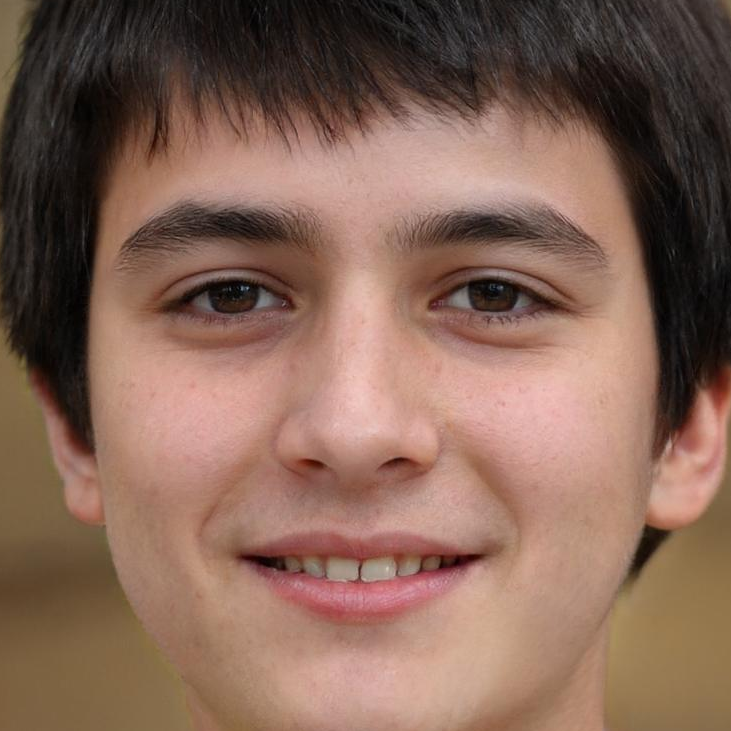

Eye Region


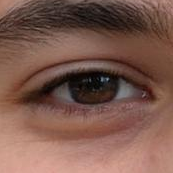

Eye Region


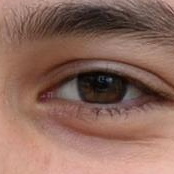

Eye Region


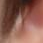

Eye Region


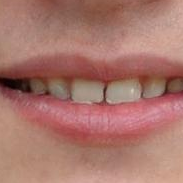

Eye Region


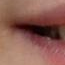

Detected Faces


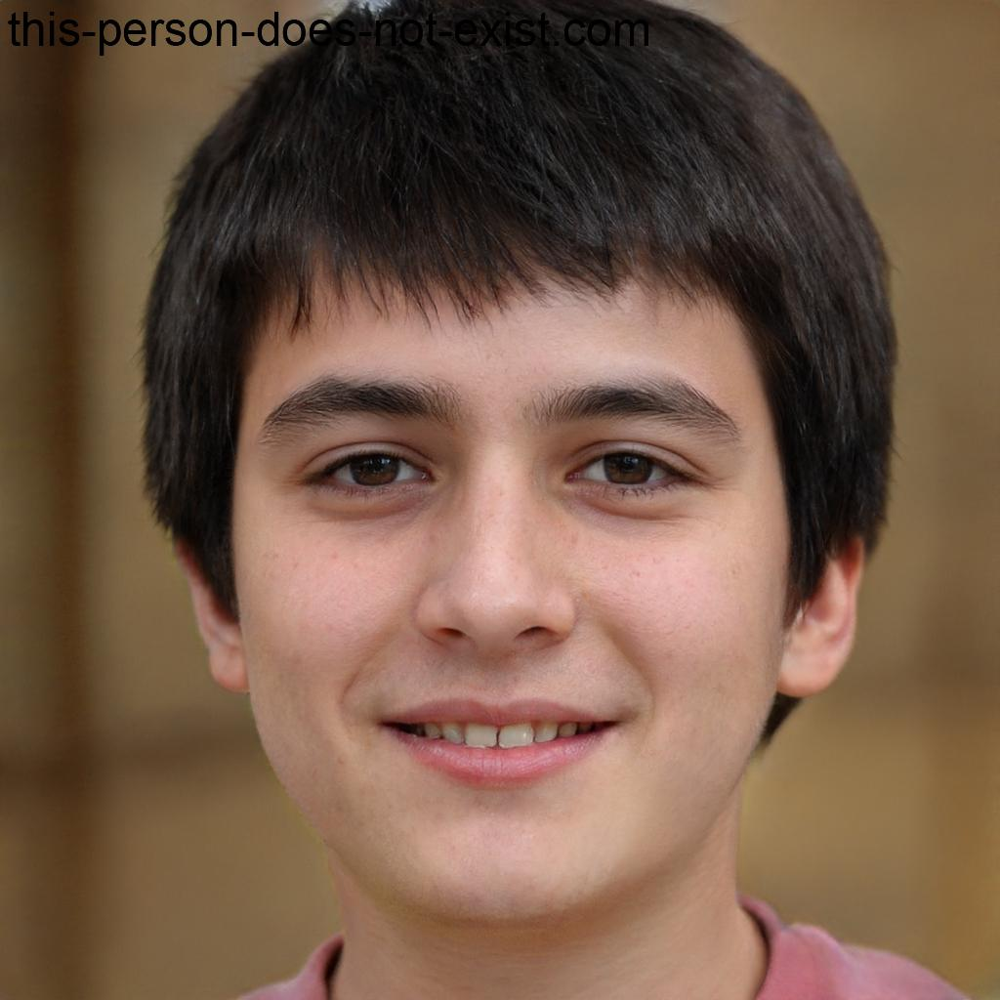

In [44]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PlusW/Lecture 4/fakepeep.jpg')

img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

faces = face_cascade.detectMultiScale(img_grey, scaleFactor = 1.1, minNeighbors = 5)

for (x, y, w, h) in faces:
  face_region = img[y : y + h, x : x + w]

  print("Face Region")
  cv2_imshow(face_region)

  eyes_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
  eyes = eyes_cascade.detectMultiScale(face_region, scaleFactor = 1.1, minNeighbors = 5)

  for (ex, ey, ew, eh) in eyes:
    eye_region = face_region[ey : ey + eh, ex : ex + ew]
    print("Eye Region")
    cv2_imshow(eye_region)


print("Detected Faces")
cv2_imshow(img)

cv2.waitKey(2)
cv2.destroyAllWindows()